# Sixth attempt at linear regression model to explain global sales

In [2]:
import pandas as pd
import pandas_profiling
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import statsmodels.api as sm
from statsmodels.graphics.gofplots import ProbPlot
from scipy import stats

In [3]:
%matplotlib inline

In [4]:
sales_joined = pd.read_csv("../clean_data/sales-joined.csv")

## Exploration

In [5]:
sales_joined

,rank,name,genre,esrb_rating,platform,publisher,developer,global_sales,na_sales,pal_sales,jp_sales,other_sales,year,critic_score,user_score
0,1,Wii Sports,Sports,E,Nintendo Wii,Nintendo,Nintendo EAD,82.86,NaN,NaN,NaN,NaN,2006,76.0,8.0
1,2,Super Mario Bros.,Platform,NaN,NES,Nintendo,Nintendo EAD,40.24,NaN,NaN,NaN,NaN,1985,NaN,NaN
2,3,Mario Kart Wii,Racing,E,Nintendo Wii,Nintendo,Nintendo EAD,37.14,NaN,NaN,NaN,NaN,2008,82.0,8.3
3,4,PlayerUnknown's Battlegrounds,Shooter,NaN,PC,PUBG Corporation,PUBG Corporation,36.60,NaN,NaN,NaN,NaN,2017,NaN,NaN
4,5,Wii Sports Resort,Sports,E,Nintendo Wii,Nintendo,Nintendo EAD,33.09,NaN,NaN,NaN,NaN,2009,80.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19829,19858,FirePower for Microsoft Combat Flight Simulator 3,Simulation,T,PC,GMX Media,Shockwave Productions,0.01,NaN,0.0,NaN,0.0,2004,NaN,NaN
19830,19859,Tom Clancy's Splinter Cell,Shooter,T,PC,Ubisoft,Ubisoft,0.01,NaN,0.0,NaN,0.0,2003,NaN,NaN
19831,19860,Ashita no Joe 2: The Anime Super Remix,Fighting,NaN,PlayStation 2,Capcom,Capcom,0.01,NaN,NaN,0.01,NaN,2002,NaN,NaN
19832,19861,Tokyo Yamanote Boys for V: Main Disc,Adventure,NaN,PlayStation Vita,Rejet,Rejet,0.01,NaN,NaN,0.01,NaN,2017,NaN,NaN


In [6]:
sales_joined.describe()

,rank,global_sales,na_sales,pal_sales,jp_sales,other_sales,year,critic_score,user_score
count,19834.000000,19834.000000,12773.000000,12123.000000,6768.000000,14499.000000,19834.000000,7952.000000,7384.00000
mean,9925.223303,0.531601,0.279823,0.168910,0.114507,0.047903,2007.403953,68.954351,7.13402
std,5733.868603,1.573721,0.515766,0.413661,0.187010,0.133507,25.495746,13.966903,1.49996
min,1.000000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,13.000000,0.00000
25%,4959.250000,0.050000,0.050000,0.020000,0.020000,0.000000,2004.000000,60.000000,6.40000
50%,9923.500000,0.160000,0.120000,0.050000,0.050000,0.010000,2008.000000,71.000000,7.50000
75%,14888.750000,0.450000,0.290000,0.160000,0.130000,0.040000,2012.000000,79.000000,8.20000
max,19862.000000,82.860000,9.760000,9.850000,2.690000,3.120000,2020.000000,98.000000,9.70000


Potential issues:
- outliers in sales columns
- rows with year == 0
- distribution of critic and user scores

In [7]:
pandas_profiling.ProfileReport(sales_joined)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
# remove certain games that were bundled with consoles
sales_joined = sales_joined.loc[sales_joined["name"] != "Wii Sports"]
sales_joined = sales_joined.loc[sales_joined["name"] != "Super Mario Bros."]

In [7]:
sales_joined.columns

Index(['genre', 'platform', 'publisher', 'global_sales', 'critic_score',
       'user_score'],
      dtype='object')

In [6]:
# drop columns we won't be needing
sales_joined.drop(['rank', 'name', 'esrb_rating', 'developer', 'na_sales', 'pal_sales', 'jp_sales', \
                  'other_sales', 'year'], axis=1, inplace=True)

In [12]:
sales_joined.describe()

,global_sales,na_sales,pal_sales,jp_sales,other_sales,year,critic_score,user_score
count,19829.000000,12773.000000,12121.000000,6767.000000,14496.000000,19829.000000,7950.000000,7382.000000
mean,0.525521,0.279823,0.168932,0.114518,0.047913,2007.708861,68.956352,7.133839
std,1.433802,0.515766,0.413691,0.187022,0.133519,6.354889,13.966064,1.500120
min,0.010000,0.000000,0.000000,0.000000,0.000000,1970.000000,13.000000,0.000000
25%,0.050000,0.050000,0.020000,0.020000,0.000000,2004.000000,60.000000,6.400000
50%,0.160000,0.120000,0.050000,0.050000,0.010000,2008.000000,71.000000,7.500000
75%,0.450000,0.290000,0.160000,0.130000,0.040000,2012.000000,79.000000,8.200000
max,37.140000,9.760000,9.850000,2.690000,3.120000,2020.000000,98.000000,9.700000


In [13]:
pandas_profiling.ProfileReport(sales_joined)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

There are many columns with a substantial amount of missing values. We will be replacing the missing values with the the associated variable's mean.

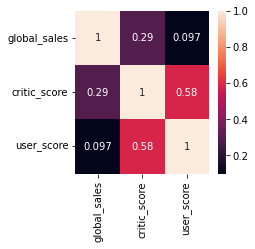

In [8]:
# look at correlation and plot heatmap
correlation = sales_joined.corr()
plt.figure(figsize=(3,3))
sns.heatmap(correlation, annot=True);

In [9]:
correlation["global_sales"].sort_values(ascending=False)

global_sales    1.000000
critic_score    0.294627
user_score      0.097206
Name: global_sales, dtype: float64

Interesting to note that critic scores are more correlated to global sales than user scores are.

<Figure size 216x216 with 0 Axes>

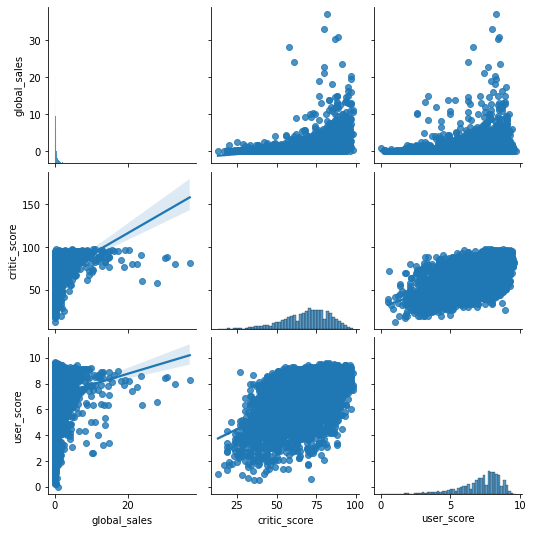

In [10]:
# variable distribution
plt.figure(figsize=(3,3))
sns.pairplot(sales_joined, kind="reg");

Global sales column appears to be heavily right skewed. Critic and user score look better, but left skewed. Outliers to deal with.

In [11]:
# look at skewness per column
for column in sales_joined[['global_sales', 'critic_score', 'user_score']].columns.values.tolist():
    print(column)
    print(sales_joined[column].skew())
    print()

global_sales
10.557045267510425

critic_score
-0.6103350214022549

user_score
-1.2543973379543365



global_sales and user_score are heavily skewed, with a skewness magnitude higher than 1.

critic_score is moderately left skewed.

In [12]:
# look at distribution for each variable
for column in sales_joined[['global_sales', 'critic_score', 'user_score']]:
    fig=px.histogram(sales_joined, x=sales_joined[column])
    fig.show();

In [13]:
# boxplot distribution for each variable
for column in sales_joined[['global_sales', 'critic_score', 'user_score']]:
    fig=px.box(sales_joined, x=sales_joined[column])
    fig.show();

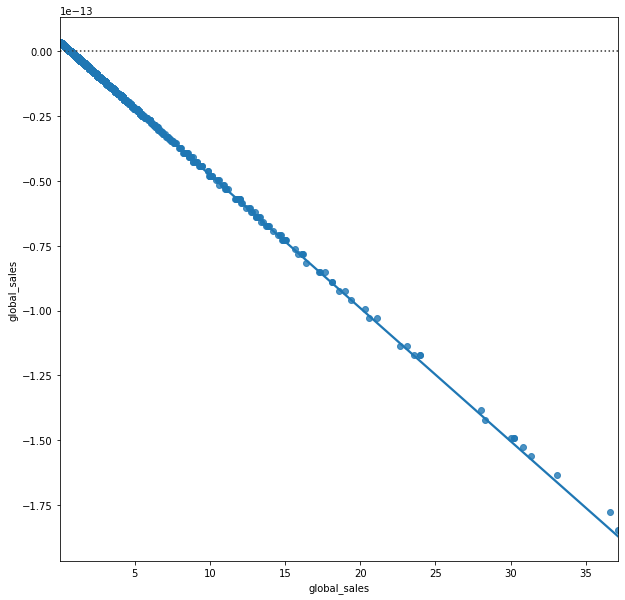

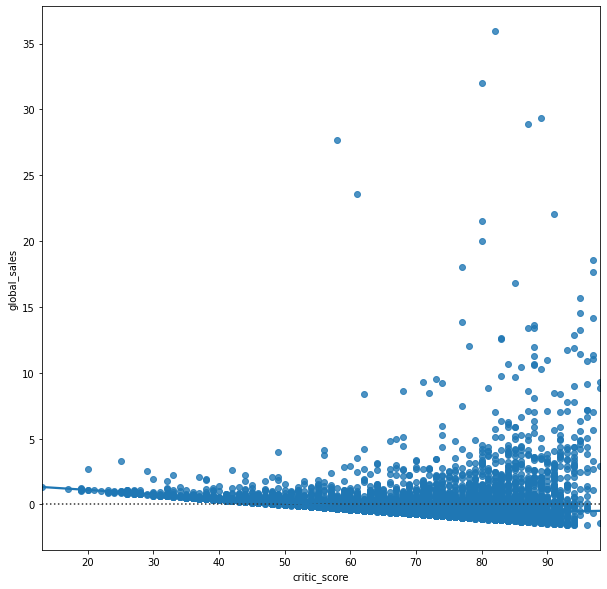

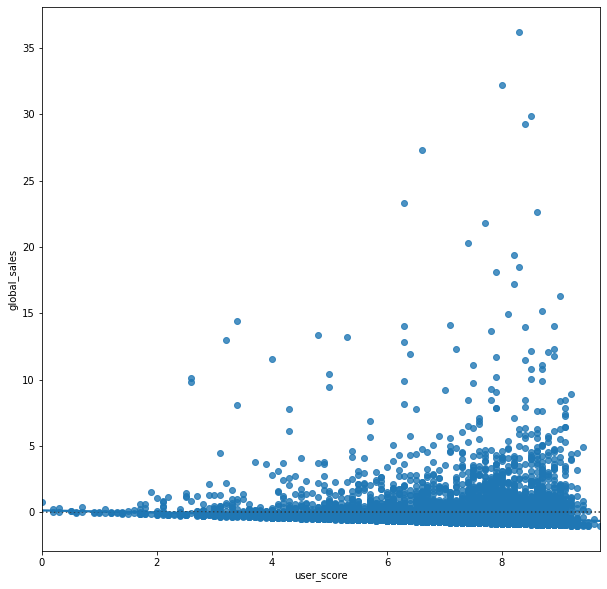

In [14]:
# look at residuals
for column in sales_joined[['global_sales', 'critic_score', 'user_score']]:
    plt.figure(figsize=(10,10))
    sns.residplot(x=sales_joined[column], y=sales_joined["global_sales"], data=sales_joined, lowess=True);

## Cleaning

In [15]:
sales_joined.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19832 entries, 2 to 19833
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   genre         19832 non-null  object 
 1   platform      19832 non-null  object 
 2   publisher     19832 non-null  object 
 3   global_sales  19832 non-null  float64
 4   critic_score  7951 non-null   float64
 5   user_score    7383 non-null   float64
dtypes: float64(3), object(3)
memory usage: 1.1+ MB


In [18]:
# log transform numeric columns

sales_joined['global_sales'] = np.log(sales_joined['global_sales'] + 0.00001)
sales_joined['na_sales'] = np.log(sales_joined['na_sales'] + 0.00001)
sales_joined['pal_sales'] = np.log(sales_joined['pal_sales'] + 0.00001)
sales_joined['jp_sales'] = np.log(sales_joined['jp_sales'] + 0.00001)
sales_joined['other_sales'] = np.log(sales_joined['other_sales'] + 0.00001)
sales_joined['critic_score'] = np.log(sales_joined['critic_score'] + 0.00001)
sales_joined['user_score'] = np.log(sales_joined['user_score'] + 0.00001)

In [20]:
# replace NaNs with mean of each variable
sales_clean = sales_joined.copy()

mean_1 = sales_clean["na_sales"].mean(axis=0)
mean_2 = sales_clean["pal_sales"].mean(axis=0)
mean_3 = sales_clean["jp_sales"].mean(axis=0)
mean_4 = sales_clean["other_sales"].mean(axis=0)
mean_5 = sales_clean["critic_score"].mean(axis=0)
mean_6 = sales_clean["user_score"].mean(axis=0)

sales_clean["na_sales"].replace(np.nan, mean_1, inplace=True)
sales_clean["pal_sales"].replace(np.nan, mean_2, inplace=True)
sales_clean["jp_sales"].replace(np.nan, mean_3, inplace=True)
sales_clean["other_sales"].replace(np.nan, mean_4, inplace=True)
sales_clean["critic_score"].replace(np.nan, mean_5, inplace=True)
sales_clean["user_score"].replace(np.nan, mean_6, inplace=True)

In [21]:
sales_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19829 entries, 2 to 19833
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   genre         19829 non-null  object 
 1   esrb_rating   13920 non-null  object 
 2   platform      19829 non-null  object 
 3   publisher     19829 non-null  object 
 4   global_sales  19829 non-null  float64
 5   na_sales      19829 non-null  float64
 6   pal_sales     19829 non-null  float64
 7   jp_sales      19829 non-null  float64
 8   other_sales   19829 non-null  float64
 9   year          19829 non-null  int64  
 10  critic_score  19829 non-null  float64
 11  user_score    19829 non-null  float64
dtypes: float64(7), int64(1), object(4)
memory usage: 2.0+ MB


In [22]:
sales_clean

,genre,esrb_rating,platform,publisher,global_sales,na_sales,pal_sales,jp_sales,other_sales,year,critic_score,user_score
2,Racing,E,Nintendo Wii,Nintendo,3.614695,-2.142358,-3.575213,-3.123959,-5.842837,2008,4.406719,2.116257
3,Shooter,NaN,PC,PUBG Corporation,3.600049,-2.142358,-3.575213,-3.123959,-5.842837,2017,4.209197,1.931424
4,Sports,E,Nintendo Wii,Nintendo,3.499231,-2.142358,-3.575213,-3.123959,-5.842837,2009,4.382027,2.079443
5,Role-Playing,E,Game Boy,Nintendo,3.446171,-2.142358,-3.575213,-3.123959,-5.842837,1998,4.209197,1.931424
6,Platform,E,Nintendo DS,Nintendo,3.427515,-2.142358,-3.575213,-3.123959,-5.842837,2006,4.488636,2.140067
...,...,...,...,...,...,...,...,...,...,...,...,...
19829,Simulation,T,PC,GMX Media,-4.604171,-2.142358,-11.512925,-3.123959,-11.512925,2004,4.209197,1.931424
19830,Shooter,T,PC,Ubisoft,-4.604171,-2.142358,-11.512925,-3.123959,-11.512925,2003,4.209197,1.931424
19831,Fighting,NaN,PlayStation 2,Capcom,-4.604171,-2.142358,-3.575213,-4.604171,-5.842837,2002,4.209197,1.931424
19832,Adventure,NaN,PlayStation Vita,Rejet,-4.604171,-2.142358,-3.575213,-4.604171,-5.842837,2017,4.209197,1.931424


In [23]:
# find and remove outliers
z = np.abs(stats.zscore(sales_clean[['global_sales', 'na_sales', 'pal_sales', 'jp_sales', 'other_sales', 'year', \
                           'critic_score', 'user_score']]))
filtered = (z<3).all(axis=1)
sales_3 = sales_clean[filtered]
sales_3.head()

,genre,esrb_rating,platform,publisher,global_sales,na_sales,pal_sales,jp_sales,other_sales,year,critic_score,user_score
33,Role-Playing,E,Nintendo DS,Nintendo,2.749832,-2.142358,-3.575213,-3.123959,-5.842837,2011,4.209197,1.931424
35,Racing,E,Nintendo Switch,Nintendo,2.709383,-2.142358,-3.575213,-3.123959,-5.842837,2017,4.209197,1.931424
36,Shooter,M,PC,VU Games,2.708051,-2.142358,-3.575213,-3.123959,-5.842837,2004,4.477337,2.186052
37,Platform,NaN,Sega Genesis,Sega,2.708051,-2.142358,-3.575213,-3.123959,-5.842837,1991,4.209197,1.931424
38,Racing,E,PlayStation 2,Sony Computer Entertainment,2.700691,-2.142358,-3.575213,-3.123959,-5.842837,2001,4.553877,2.128233


In [24]:
# look at skewness again
plt.figure(figsize=(7,7))
sns.pairplot(sales_3, kind="reg");

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x7fdc5cf19e50> (for post_execute):


KeyboardInterrupt: 

<Figure size 504x504 with 0 Axes>

Error in callback <function flush_figures at 0x7fdc5e693040> (for post_execute):


KeyboardInterrupt: 

Not ideal but looks better.

## Model building

In [25]:
sales_3

,genre,esrb_rating,platform,publisher,global_sales,na_sales,pal_sales,jp_sales,other_sales,year,critic_score,user_score
33,Role-Playing,E,Nintendo DS,Nintendo,2.749832,-2.142358,-3.575213,-3.123959,-5.842837,2011,4.209197,1.931424
35,Racing,E,Nintendo Switch,Nintendo,2.709383,-2.142358,-3.575213,-3.123959,-5.842837,2017,4.209197,1.931424
36,Shooter,M,PC,VU Games,2.708051,-2.142358,-3.575213,-3.123959,-5.842837,2004,4.477337,2.186052
37,Platform,NaN,Sega Genesis,Sega,2.708051,-2.142358,-3.575213,-3.123959,-5.842837,1991,4.209197,1.931424
38,Racing,E,PlayStation 2,Sony Computer Entertainment,2.700691,-2.142358,-3.575213,-3.123959,-5.842837,2001,4.553877,2.128233
...,...,...,...,...,...,...,...,...,...,...,...,...
19825,Puzzle,NaN,Nintendo DS,Nintendo,-4.604171,-2.142358,-3.575213,-4.604171,-5.842837,2007,4.209197,1.931424
19827,Puzzle,NaN,Nintendo DS,Russel,-4.604171,-2.142358,-3.575213,-4.604171,-5.842837,2009,4.209197,1.931424
19831,Fighting,NaN,PlayStation 2,Capcom,-4.604171,-2.142358,-3.575213,-4.604171,-5.842837,2002,4.209197,1.931424
19832,Adventure,NaN,PlayStation Vita,Rejet,-4.604171,-2.142358,-3.575213,-4.604171,-5.842837,2017,4.209197,1.931424


In [26]:
# create dummy variables
sales_3 = pd.get_dummies(sales_3, drop_first = True)

In [27]:
# set response array 
y = sales_3["global_sales"]

# put predictors in a data frame
X = sales_3.drop(columns = "global_sales")

In [28]:
# model
model_1 = sm.OLS(y, X).fit()
model_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:           global_sales   R-squared (uncentered):                   0.908
Model:                            OLS   Adj. R-squared (uncentered):              0.902
Method:                 Least Squares   F-statistic:                              172.1
Date:                Thu, 02 Jun 2022   Prob (F-statistic):                        0.00
Time:                        20:48:03   Log-Likelihood:                         -19096.
No. Observations:               17608   AIC:                                  4.010e+04
Df Residuals:                   16656   BIC:                                  4.750e+04
Df Model:                         952                                                  
Covariance Type:            nonrobust                                                  
====================================================================================================================
                                                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------
na_sales                                             0.3834      0.009     42.851      0.000       0.366       0.401
pal_sales                                            0.2891      0.008     37.187      0.000       0.274       0.304
jp_sales                                             0.4617      0.009     48.948      0.000       0.443       0.480
other_sales                                          0.1508      0.003     50.718      0.000       0.145       0.157
year                                                -0.0003      0.000     -1.077      0.282      -0.001       0.000
critic_score                                         0.7139      0.064     11.155      0.000       0.588       0.839
user_score                                           0.2548      0.063      4.049      0.000       0.131       0.378
genre_Action-Adventure                               0.0088      0.047      0.187      0.852      -0.084       0.101
genre_Adventure                                     -0.1873      0.026     -7.240      0.000      -0.238      -0.137
genre_Board Game                                    -0.0036      0.526     -0.007      0.994      -1.035       1.028
genre_Education                                     -0.6382      0.521     -1.224      0.221      -1.660       0.384
genre_Fighting                                       0.0494      0.032      1.550      0.121      -0.013       0.112
genre_MMO                                           -0.2177      0.123     -1.772      0.076      -0.458       0.023
genre_Misc                                          -0.1196      0.025     -4.873      0.000      -0.168      -0.072
genre_Music                                         -0.0888      0.068     -1.300      0.194      -0.223       0.045
genre_Party                                          0.1359      0.134      1.014      0.310      -0.127       0.399
genre_Platform                                       0.1772      0.030      5.895      0.000       0.118       0.236
genre_Puzzle                                        -0.1382      0.039     -3.579      0.000      -0.214      -0.063
genre_Racing                                         0.0588      0.029      2.052      0.040       0.003       0.115
genre_Role-Playing                                   0.0173      0.026      0.669      0.503      -0.033       0.068
genre_Sandbox                                        0.2189      0.319      0.687      0.492      -0.406       0.844
genre_Shooter                                       -0.0357      0.027     -1.315      0.189      -0.089       0.018
genre_Simulation                                    -0.0095

In [29]:
from sklearn.linear_model import LinearRegression

In [30]:
# define model and fit it using extracted data
model_2 = LinearRegression()

model_2.fit(X, y)

LinearRegression()

In [31]:
# check model's R-squared value
model_2.score(X, y)

0.7752670226359033

In [32]:
model_2.intercept_

26.658376102255133

In [33]:
model_2.coef_

array([ 3.81074854e-01,  2.90454584e-01,  4.61000409e-01,  1.50864176e-01,
       -1.35105691e-02,  7.01661646e-01,  2.28117146e-01,  1.51570646e-02,
       -1.88240068e-01, -4.70094747e-03, -6.48705150e-01,  4.81194617e-02,
       -1.96475337e-01, -1.18208210e-01, -6.55110707e-02,  1.33549479e-01,
        1.73098386e-01, -1.45298988e-01,  5.13348343e-02,  1.86927542e-02,
        2.22857879e-01, -4.13551305e-02, -1.42675285e-02, -3.80276422e-03,
       -1.76279621e-01, -6.62788847e-02,  2.00761194e-01,  1.50371439e-01,
        2.96865953e-01, -2.15294221e-01,  2.25714719e-01, -3.17336700e-01,
       -6.19647786e-01,  1.25562487e-01, -6.16566432e-01, -4.48543017e-02,
       -1.28219556e+00, -1.07922507e+00, -3.03505228e-01, -1.06301688e+00,
       -9.90083187e-01, -8.90977529e-01, -1.04678023e+00, -8.61448942e-01,
       -9.52855826e-01, -1.08026730e+00, -1.08050144e+00, -1.08731933e+00,
       -1.48766893e+00, -1.19855747e+00, -1.30911936e+00, -4.42944279e-01,
       -1.14317881e+00, -

In [34]:
pd.DataFrame(
  {
  "Variable" : X.columns.values,
  "Coefficient" : model_2.coef_
  }
)

,Variable,Coefficient
0,na_sales,0.381075
1,pal_sales,0.290455
2,jp_sales,0.461000
3,other_sales,0.150864
4,year,-0.013511
...,...,...
947,publisher_imageepoch Inc.,-1.094118
948,publisher_inXile Entertainment,-0.208035
949,publisher_indiePub,0.389927
950,"publisher_mixi, Inc",2.427090


In [35]:
# add in the constant to the data
X = sm.add_constant(X)
X.head()

/usr/local/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x = pd.concat(x[::order], 1)


,const,na_sales,pal_sales,jp_sales,other_sales,year,critic_score,user_score,genre_Action-Adventure,genre_Adventure,...,publisher_eGames,publisher_fonfun,publisher_honeybee,publisher_iMel,publisher_iWin,publisher_imageepoch Inc.,publisher_inXile Entertainment,publisher_indiePub,"publisher_mixi, Inc",publisher_responDESIGN
33,1.0,-2.142358,-3.575213,-3.123959,-5.842837,2011,4.209197,1.931424,0,0,...,0,0,0,0,0,0,0,0,0,0
35,1.0,-2.142358,-3.575213,-3.123959,-5.842837,2017,4.209197,1.931424,0,0,...,0,0,0,0,0,0,0,0,0,0
36,1.0,-2.142358,-3.575213,-3.123959,-5.842837,2004,4.477337,2.186052,0,0,...,0,0,0,0,0,0,0,0,0,0
37,1.0,-2.142358,-3.575213,-3.123959,-5.842837,1991,4.209197,1.931424,0,0,...,0,0,0,0,0,0,0,0,0,0
38,1.0,-2.142358,-3.575213,-3.123959,-5.842837,2001,4.553877,2.128233,0,0,...,0,0,0,0,0,0,0,0,0,0


In [36]:
sm_model = sm.OLS(y, X).fit()
sm_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           global_sales   R-squared:                       0.775
Model:                            OLS   Adj. R-squared:                  0.762
Method:                 Least Squares   F-statistic:                     60.35
Date:                Thu, 02 Jun 2022   Prob (F-statistic):               0.00
Time:                        20:50:31   Log-Likelihood:                -19081.
No. Observations:               17608   AIC:                         4.007e+04
Df Residuals:                   16655   BIC:                         4.748e+04
Df Model:                         952                                         
Covariance Type:            nonrobust                                         
====================================================================================================================
                                                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------
const                                               26.6584      4.992      5.341      0.000      16.874      36.443
na_sales                                             0.3811      0.009     42.573      0.000       0.364       0.399
pal_sales                                            0.2905      0.008     37.375      0.000       0.275       0.306
jp_sales                                             0.4610      0.009     48.908      0.000       0.443       0.479
other_sales                                          0.1509      0.003     50.780      0.000       0.145       0.157
year                                                -0.0135      0.002     -5.435      0.000      -0.018      -0.009
critic_score                                         0.7017      0.064     10.966      0.000       0.576       0.827
user_score                                           0.2281      0.063      3.617      0.000       0.104       0.352
genre_Action-Adventure                               0.0152      0.047      0.322      0.748      -0.077       0.107
genre_Adventure                                     -0.1882      0.026     -7.280      0.000      -0.239      -0.138
genre_Board Game                                    -0.0047      0.526     -0.009      0.993      -1.035       1.026
genre_Education                                     -0.6487      0.521     -1.245      0.213      -1.670       0.372
genre_Fighting                                       0.0481      0.032      1.511      0.131      -0.014       0.111
genre_MMO                                           -0.1965      0.123     -1.600      0.110      -0.437       0.044
genre_Misc                                          -0.1182      0.025     -4.818      0.000      -0.166      -0.070
genre_Music                                         -0.0655      0.068     -0.958      0.338      -0.200       0.068
genre_Party                                          0.1335      0.134      0.998      0.318      -0.129       0.396
genre_Platform                                       0.1731      0.030      5.763      0.000       0.114       0.232
genre_Puzzle                                        -0.1453      0.039     -3.765      0.000      -0.221      -0.070
genre_Racing                                         0.0513      0.029      1.792      0.073      -0.005       0.107
genre_Role-Playing                                   0.0187      0.026      0.722      0.470      -0.032       0.069
genre_Sandbox                                        0.2229      0.319      0.700      0.484      -0.402       0.847
genre_Shooter                                       -0.0414      0.027     -1.522      0.128      -0.095       0.012
genre_Simulation                         